In [51]:
%matplotlib inline

In [52]:
import itertools
from pathlib import Path

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import mne
import mne_bids

In [53]:
ROOT = Path("../data/MASC-MEG")

EPOCHS_ID = "250Hz-800ms-sub12"

EPOCHS_ROOT = Path("../data/formatted/words/")

sorted(EPOCHS_ROOT.rglob("*"))

[PosixPath('../data/formatted/words/audio-12-word-100Hz-800ms-simple-rescale.test.npy'),
 PosixPath('../data/formatted/words/audio-12-word-100Hz-800ms-simple-rescale.train.npy'),
 PosixPath('../data/formatted/words/audio-12-word-250Hz-800ms.test.npy'),
 PosixPath('../data/formatted/words/audio-12-word-250Hz-800ms.train.npy'),
 PosixPath('../data/formatted/words/epochs-12-word-100Hz-800ms-simple-rescale.test.npy'),
 PosixPath('../data/formatted/words/epochs-12-word-100Hz-800ms-simple-rescale.train.npy'),
 PosixPath('../data/formatted/words/epochs-12-word-250Hz-800ms.test.npy'),
 PosixPath('../data/formatted/words/epochs-12-word-250Hz-800ms.train.npy'),
 PosixPath('../data/formatted/words/info-12-word-100Hz-800ms-simple-rescale.pkl'),
 PosixPath('../data/formatted/words/info-12-word-250Hz-800ms.pkl'),
 PosixPath('../data/formatted/words/meta-12-word-100Hz-800ms-simple-rescale.csv'),
 PosixPath('../data/formatted/words/meta-12-word-250Hz-800ms.csv')]

In [54]:
train_audio_path = sorted(EPOCHS_ROOT.rglob("audio*train*"))[0]
test_audio_path = sorted(EPOCHS_ROOT.rglob("audio*test*"))[0]

train_epochs_path = sorted(EPOCHS_ROOT.rglob("epochs*train*"))[0]
test_epochs_path = sorted(EPOCHS_ROOT.rglob("epochs*test*"))[0]

info_path = sorted(EPOCHS_ROOT.rglob("info*"))[0]
meta_path = sorted(EPOCHS_ROOT.rglob("meta*"))[0]

In [55]:
phoneme_info = pd.read_csv(ROOT / "phoneme_info.csv")
phoneme_list = phoneme_info.phoneme.tolist()

In [56]:
from pathlib import Path
import yaml


def load_parameters(param_path):
    with open(param_path, "r") as fp:
        params = Parameters(**yaml.load(fp, yaml.Loader))
    return params


class Parameters(dict):
    def __getattr__(self, attr):
        try:
            if isinstance(self[attr], dict):
                return Parameters(**self[attr])
            return self[attr]
        except KeyError:
            raise AttributeError(attr)

    def __getitem__(self, item):
        if item in self:
            if isinstance(self.get(item), dict):
                return Parameters(**self.get(item))
            return self.get(item)
        else:
            raise KeyError(item)

    def __repr__(self):
        return "Parameters " + super(Parameters, self).__repr__()

    def __str__(self):
        return "Parameters " + super(Parameters, self).__str__()

    @property
    def sfreq(self):
        if "epochs" in self and "decim" in self.epochs:
            return self.sampling_rate / self.epochs.decim
        else:
            return self.sampling_rate

    def save(self, path):
        with open(path, "w+") as fp:
            yaml.dump(dict(**self), fp)

In [57]:
P = load_parameters(Path("../config/decim-10-const-rescale.yaml"))
pd.DataFrame(P)

,meg,epochs,sound,test_story,seed
sfreq,1000,100,22050,lw1,54321
bandpass,"{'high': 30.0, 'low': 0.5}",NaN,NaN,lw1,54321
scaler,const,NaN,NaN,lw1,54321
scaler_params,"{'quantile_range': [0.5, 95.0], 'coef': 100000...",NaN,NaN,lw1,54321
clip,"[None, None]",NaN,NaN,lw1,54321
decim,NaN,10,NaN,lw1,54321
tmin,NaN,-0.2,NaN,lw1,54321
tmax,NaN,0.6,NaN,lw1,54321
baseline,NaN,"[-0.2, 0.0]",NaN,lw1,54321
epoch_length,NaN,81,NaN,lw1,54321


In [60]:
def get_epochs(subject, level="all"):
    all_w_epochs, all_ph_epochs = list(), list()
    for session, task in itertools.product(range(2), range(2)):
        print(f"Loading: sub{subject}-sess{session}-task{task}")

        bids_path = mne_bids.BIDSPath(
            subject=subject,
            session=str(session),
            task=str(task),
            datatype="meg",
            root=ROOT,
        )

        try:
            raw = mne_bids.read_raw_bids(bids_path)
        except FileNotFoundError:
            print(f"Not found: sub{subject}-sess{session}-task{task}")
            continue

        raw = raw.pick_types(meg=True, misc=False, eeg=False, eog=False, ecg=False)

        raw.load_data().filter(P.meg.bandpass.low, P.meg.bandpass.high, n_jobs=1)

        annotations = preprocess_annotations(raw)

        w_epochs = ph_epochs = None
        if level in ["word", "all"]:
            words = annotations.query("kind=='word' or kind=='phonem'")
            w_epochs = segment(raw, words)
            w_epochs.metadata["half"] = np.round(
                np.linspace(0, 1.0, len(w_epochs))
            ).astype(int)
            w_epochs.metadata["task"] = task
            w_epochs.metadata["session"] = session

            all_w_epochs.append(w_epochs)

        if level in ["phoneme", "all"]:
            phonemes = annotations.query("kind=='phoneme'")
            ph_epochs = segment(raw, phonemes)
            ph_epochs.metadata["half"] = np.round(
                np.linspace(0, 1.0, len(ph_epochs))
            ).astype(int)
            ph_epochs.metadata["task"] = task
            ph_epochs.metadata["session"] = session

            all_ph_epochs.append(ph_epochs)

    w_epochs = None
    if len(all_w_epochs) > 0:
        w_epochs = concatenate(all_w_epochs)
        w_epochs = w_epochs["is_word"]

    ph_epochs = None
    if len(all_ph_epochs) > 0:
        ph_epochs = concatenate(all_ph_epochs)

    return w_epochs, ph_epochs, annotations


def concatenate(all_epochs):
    epochs = mne.concatenate_epochs(all_epochs)
    m = epochs.metadata
    label = (
        "t"
        + m.task.astype(str)
        + "_s"
        + m.session.astype(str)
        + "_h"
        + m.half.astype(str)
    )
    epochs.metadata["label"] = label

    return epochs


def preprocess_annotations(raw):
    df_raw = raw.annotations.to_data_frame()
    df_raw["onset"] = raw.annotations.onset
    df_desc = pd.DataFrame(df_raw.description.apply(eval).to_list())
    df = pd.concat([df_raw.drop("description", axis=1), df_desc], axis=1)

    df[["index", "subject"]] = df[["index", "subject"]].fillna(method="ffill")

    df_ = df.copy().query("kind != 'sound'")

    df_["word"] = df_["word"].shift(-1)
    df_filled = df_["word"].fillna(method="ffill")

    df.loc[df["kind"] != "sound", "word"] = df_filled
    
    words = df.query("kind=='word'")
    df.loc[words.index + 1, "is_word"] = True

    def as_short_phoneme(x):
        if isinstance(x, str):
            return x.split("_")[0]
        return x

    def as_phoneme_code(x):
        if isinstance(x, str):
            return phoneme_list.index(x.split("_")[0])
        return x

    df["s_phoneme"] = df["phoneme"].apply(as_short_phoneme)
    df["phoneme_code"] = df["phoneme"].apply(as_phoneme_code)

    return df


def segment(raw, meta):
    events = np.c_[meta.onset * raw.info["sfreq"], np.ones((len(meta), 2))].astype(int)

    epochs = mne.Epochs(
        raw,
        events,
        tmin=P.epochs.tmin,
        tmax=P.epochs.tmax,
        decim=P.epochs.decim,
        baseline=tuple(P.epochs.baseline),
        metadata=meta,
        preload=True,
        event_repeated="drop",
    )
    
    th = np.percentile(np.abs(epochs._data), 95)
    epochs._data[:] = np.clip(epochs._data, -th, th)
    epochs.apply_baseline()

    return epochs

## Decoding task 2.1: MEG -> phoneme sequence

In [61]:
w_epochs, _, df = get_epochs(subject="12", level="word")

Loading: sub12-sess0-task0
Extracting SQD Parameters from ../data/MASC-MEG/sub-12/ses-0/meg/sub-12_ses-0_task-0_meg.con...
Creating Raw.info structure...
Setting channel info structure...
Creating Info structure...
Ready.
Reading events from ../data/MASC-MEG/sub-12/ses-0/meg/sub-12_ses-0_task-0_events.tsv.
Reading channel info from ../data/MASC-MEG/sub-12/ses-0/meg/sub-12_ses-0_task-0_channels.tsv.
The stimulus channel "STI 014" is present in the raw data, but not included in channels.tsv. Removing the channel.
Reading 0 ... 371999  =      0.000 ...   371.999 secs...


/tmp/ipykernel_17540/2189801370.py:15: RuntimeWarning: The unit for channel(s) MISC 001, MISC 002, MISC 003, MISC 004, MISC 005, MISC 006, MISC 007, MISC 008, MISC 009, MISC 010, MISC 011, MISC 012, MISC 013, MISC 014, MISC 015, MISC 016, MISC 017, MISC 018, MISC 019, MISC 020, MISC 021, MISC 022, MISC 023, MISC 024, MISC 025, MISC 026, MISC 027, MISC 028, MISC 029, MISC 030, MISC 031, MISC 032 has changed from V to NA.
  raw = mne_bids.read_raw_bids(bids_path)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 6601 samples (6.601 sec)

Adding metadata with 22 columns
668 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 668 events and 801 original time points (prior to decimation) ...
0 bad epochs dropped
Applying baseline correction (mode: mean)
Loading: sub12-sess0-task1
Extracting SQD Parameters from ../data/MASC-MEG/sub-12/ses-0/meg/sub-12_ses-0_task-1_meg.con...
Creating Raw.info st

/tmp/ipykernel_17540/2189801370.py:15: RuntimeWarning: The unit for channel(s) MISC 001, MISC 002, MISC 003, MISC 004, MISC 005, MISC 006, MISC 007, MISC 008, MISC 009, MISC 010, MISC 011, MISC 012, MISC 013, MISC 014, MISC 015, MISC 016, MISC 017, MISC 018, MISC 019, MISC 020, MISC 021, MISC 022, MISC 023, MISC 024, MISC 025, MISC 026, MISC 027, MISC 028, MISC 029, MISC 030, MISC 031, MISC 032 has changed from V to NA.
  raw = mne_bids.read_raw_bids(bids_path)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 6601 samples (6.601 sec)

Adding metadata with 22 columns
1503 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 1503 events and 801 original time points (prior to decimation) ...
0 bad epochs dropped
Applying baseline correction (mode: mean)
Loading: sub12-sess1-task0
Not found: sub12-sess1-task0
Loading: sub12-sess1-task1
Not found: sub12-sess1-task1
Adding metadata with 25 colum

/tmp/ipykernel_17540/2189801370.py:62: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  epochs = mne.concatenate_epochs(all_epochs)


KeyError: 'Event name "is_word" could not be found. The following events are present in the data: 1 The epochs.metadata Pandas query did not yield any results: None of [Float64Index([nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,\n              ...\n              nan, nan, nan, nan, nan, nan, nan, nan, nan, nan],\n             dtype=\'float64\', length=2171)] are in the [index]'

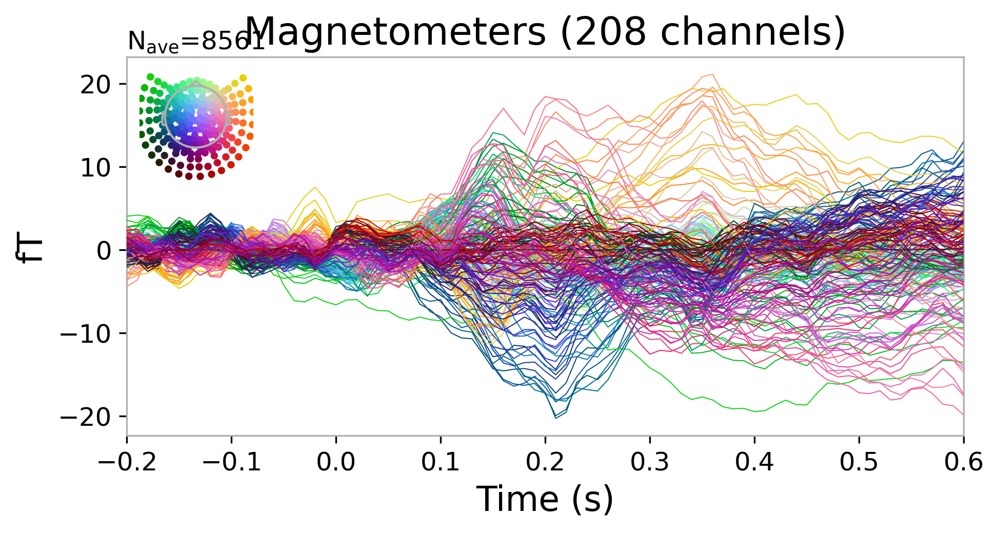

In [62]:
w_epochs.average().plot()
plt.show()

In [63]:
X = w_epochs.get_data() * 1e13

In [64]:
w_recon = mne.EpochsArray(X / 1e13, w_epochs.info, metadata=w_epochs.metadata)

Adding metadata with 25 columns
8561 matching events found
No baseline correction applied
0 projection items activated


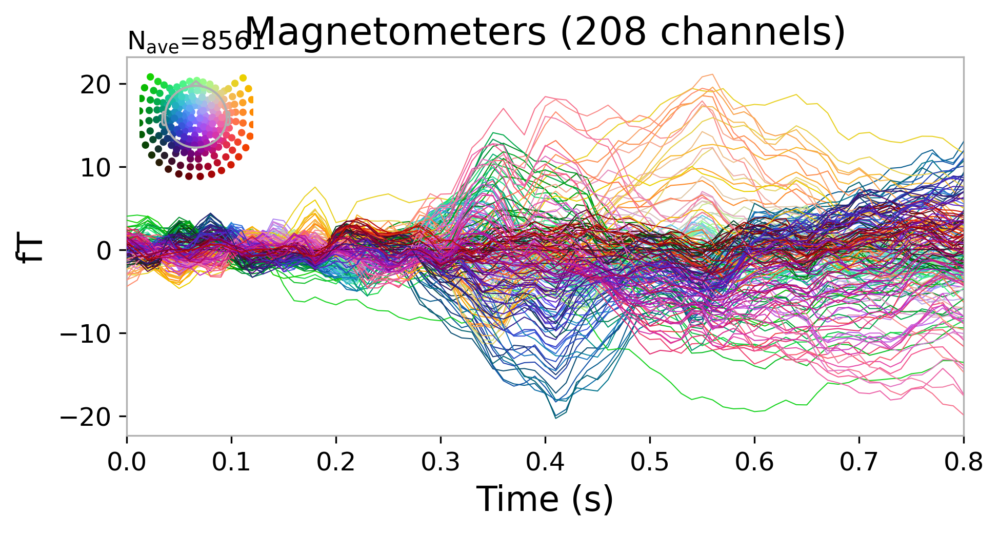

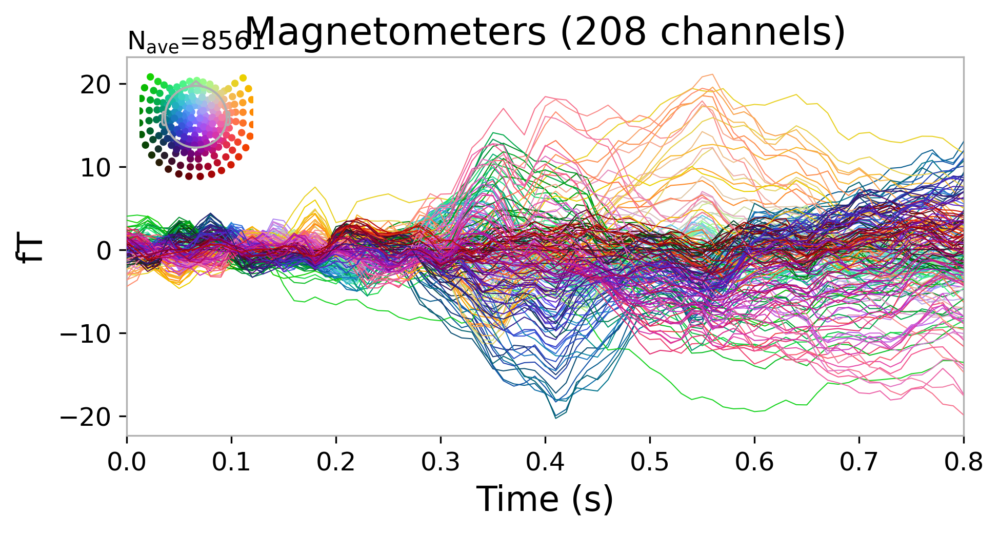

In [65]:
w_recon.average().plot()

In [66]:
np.save("test.npy", X)

In [67]:
X = np.load("test.npy")

In [68]:
w_recon = mne.EpochsArray(X/1e13, w_epochs.info)

Not setting metadata
8561 matching events found
No baseline correction applied
0 projection items activated


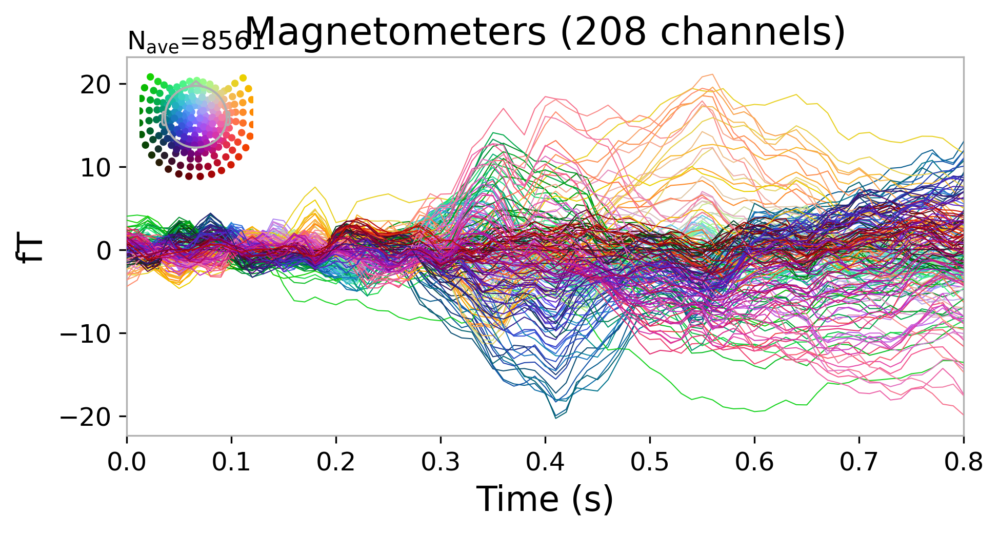

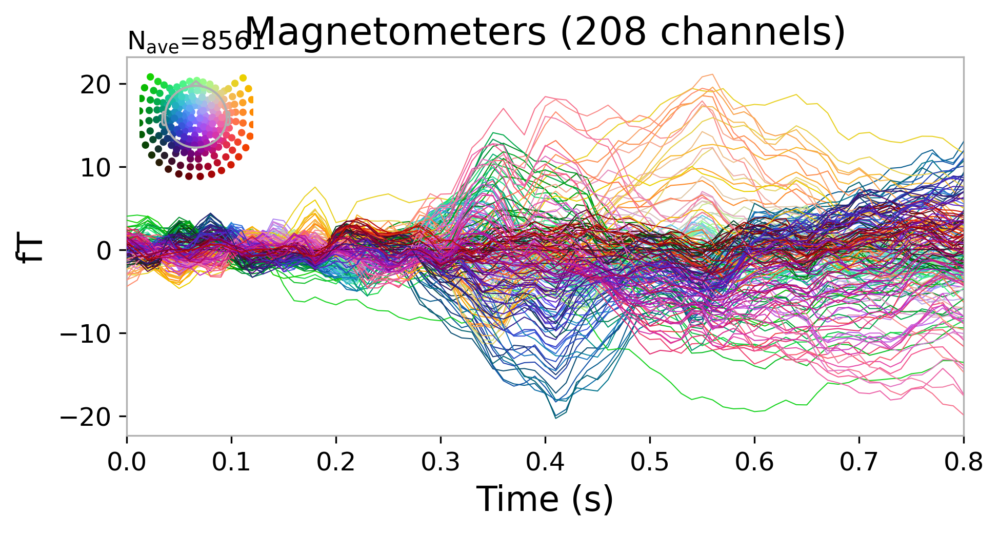

In [69]:
w_recon.average().plot()

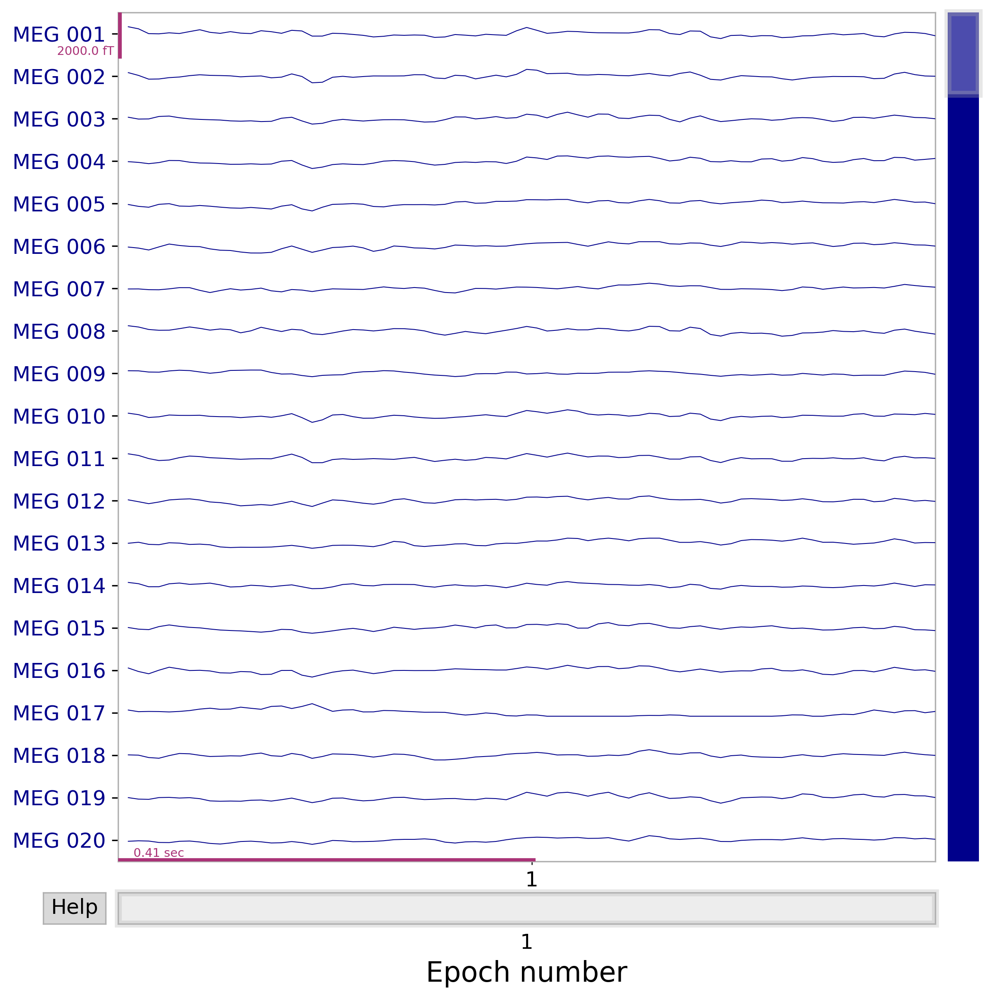

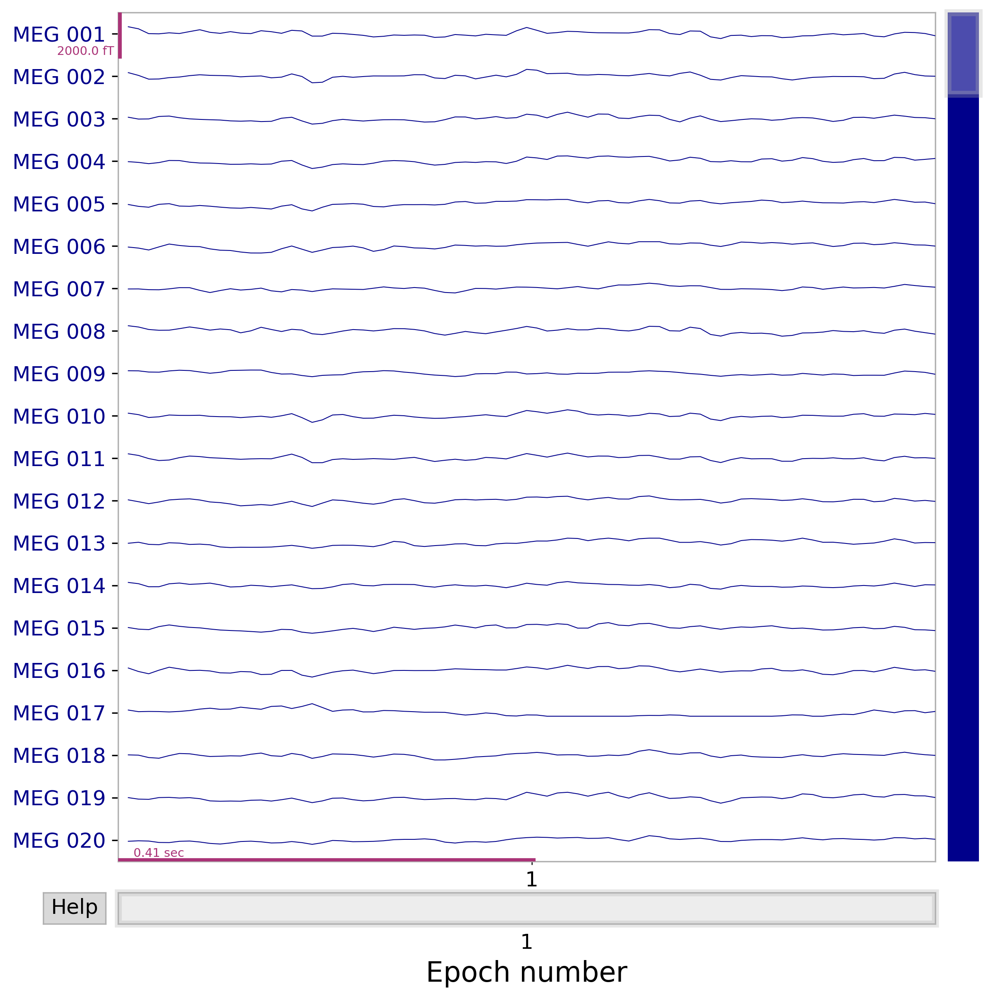

In [70]:
w_epochs[1].plot()

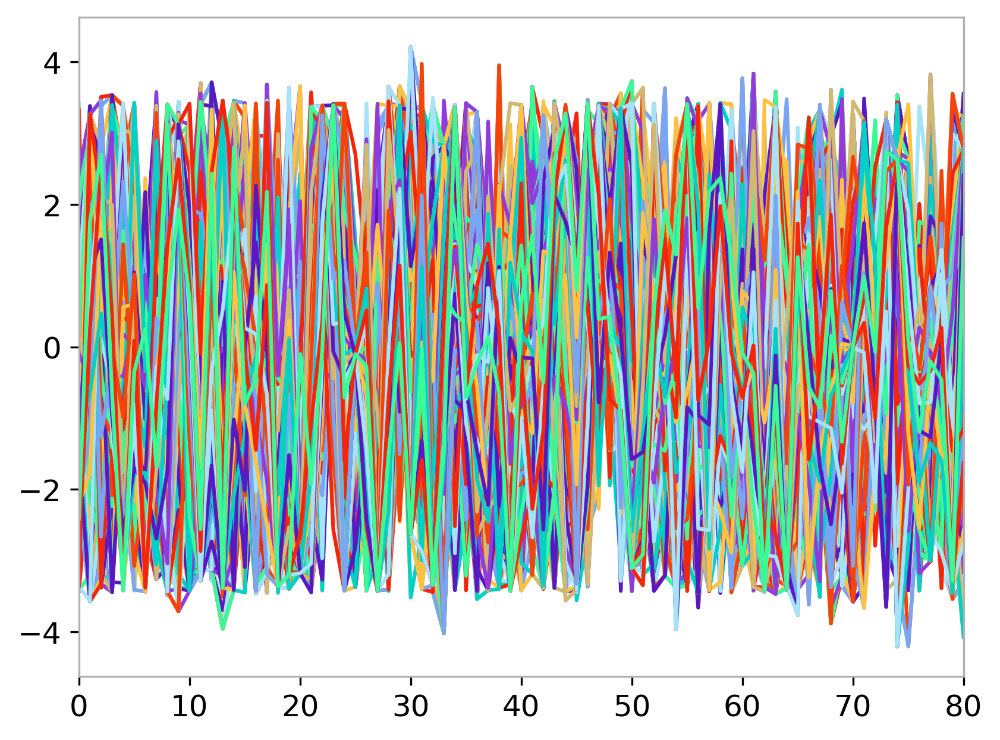

In [71]:
plt.plot(X[1200].reshape(81, 208))
plt.show()

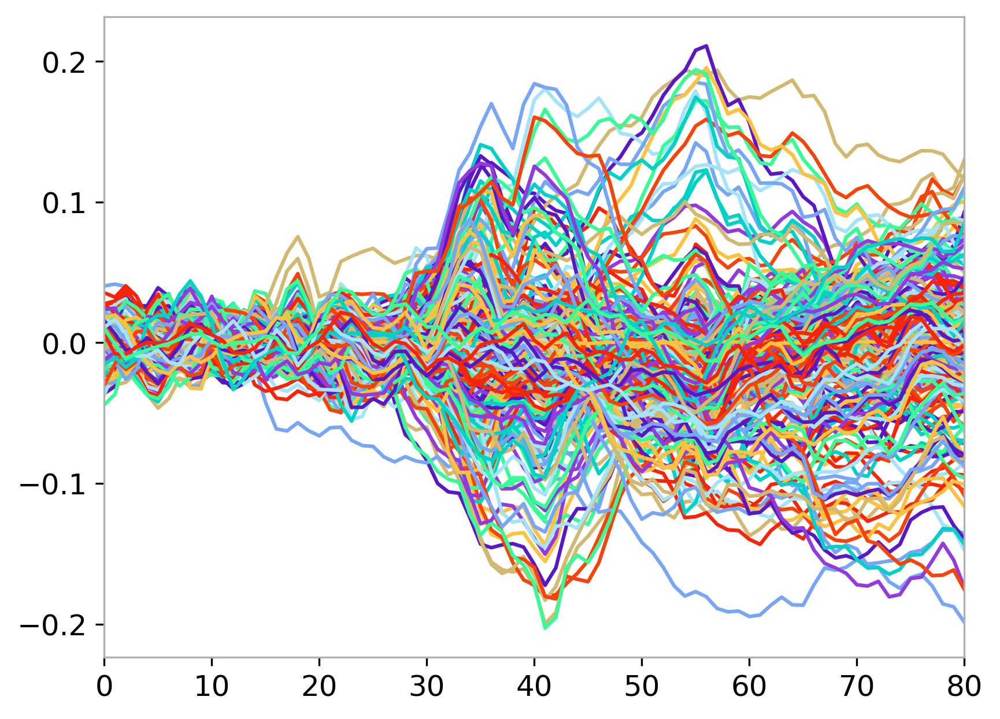

In [72]:
plt.plot(np.mean(X, axis=0).T)
plt.show()

<AxesSubplot: xlabel='word'>

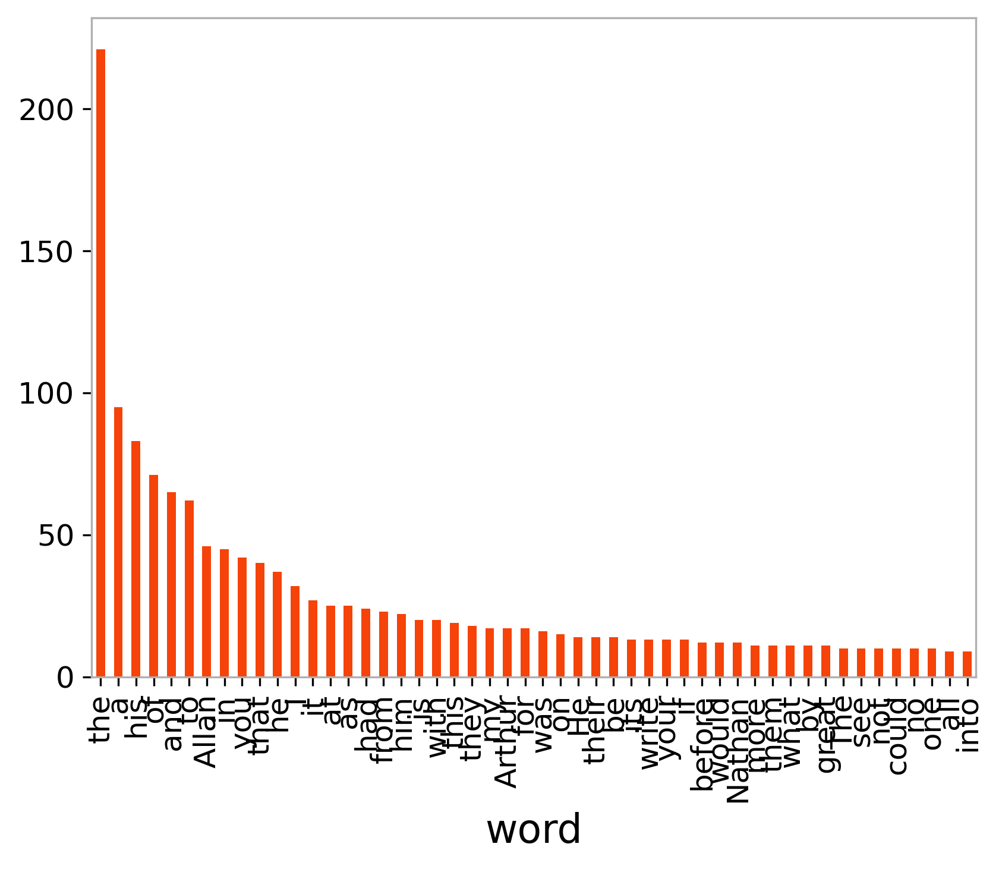

In [26]:
df.query("kind=='word'").groupby("word")["word"].count().sort_values(
    ascending=False
).iloc[:50].plot.bar()

In [269]:
lonely_index = ph_epochs.metadata.query(
    "s_phoneme == 'zh' or s_phoneme == 'oy'"
).index.values

In [270]:
X = np.swapaxes(ph_epochs.get_data()[:, :208, :], 1, 2)
X = np.delete(X, lonely_index, axis=0)

In [271]:
X.shape  # (n_epochs, timesteps, channels)

# 701 timesteps = 600 epoch + 101 baseline at 200Hz

(30676, 81, 208)

In [272]:
ph_epochs.info["sfreq"]

100.0

In [233]:
def tile_ph_annotations(epochs):

    annots = epochs.metadata
    sfreq = epochs.info["sfreq"]
    n_samples, _, n_timepts = epochs.get_data().shape

    y = np.ones((n_samples, n_timepts, 1), dtype=np.int32) * -1
    for i in range(n_samples):
        start_onset = float(annots.loc[i, "onset"])

        start_epoch = start_onset - P.epochs.tmin
        end_epoch = start_onset + P.epochs.tmax

        in_epoch_phons = annots[
            (annots["onset"] >= start_epoch) & (annots["onset"] <= end_epoch)
        ]

        def tile(x):
            onset = round((x.onset - start_onset) * sfreq)
            steps = round(x.duration * sfreq)

            return (x.phoneme_code, np.arange(onset, onset + steps))

        indexes = in_epoch_phons.apply(tile, axis=1).values

        for val, idx in indexes:
            y[i, idx, :] = val

    y[np.where(y == -1)] = phoneme_list.index("sil")

    return y

In [118]:
y = tile_ph_annotations(ph_epochs)

IndexError: index 81 is out of bounds for axis 1 with size 81

In [273]:
phonemes = ph_epochs.metadata.phoneme_code.values
phonemes

array([47., 16., 44., ..., 14.,  2., 35.])

In [274]:
y = np.tile(phonemes, (81, 1)).T[:, :, np.newaxis].astype(int)
y = np.delete(y, lonely_index, axis=0)
y.shape

(30676, 81, 1)

In [275]:
phonemes = np.delete(phonemes, lonely_index, axis=0)

In [276]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import RobustScaler

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.1, random_state=42, stratify=phonemes
)

n_train, time_length, n_channels = X_train.shape
n_test = X_test.shape[0]

robust_scaler = RobustScaler(quantile_range=P.quantile_range)

X_train = robust_scaler.fit_transform(X_train.reshape(-1, n_channels))
X_test = robust_scaler.transform(X_test.reshape(-1, n_channels))

th = 20
X_train = np.clip(X_train, -th, th).reshape(n_train, time_length, n_channels)
X_test = np.clip(X_test, -th, th).reshape(n_test, time_length, n_channels)

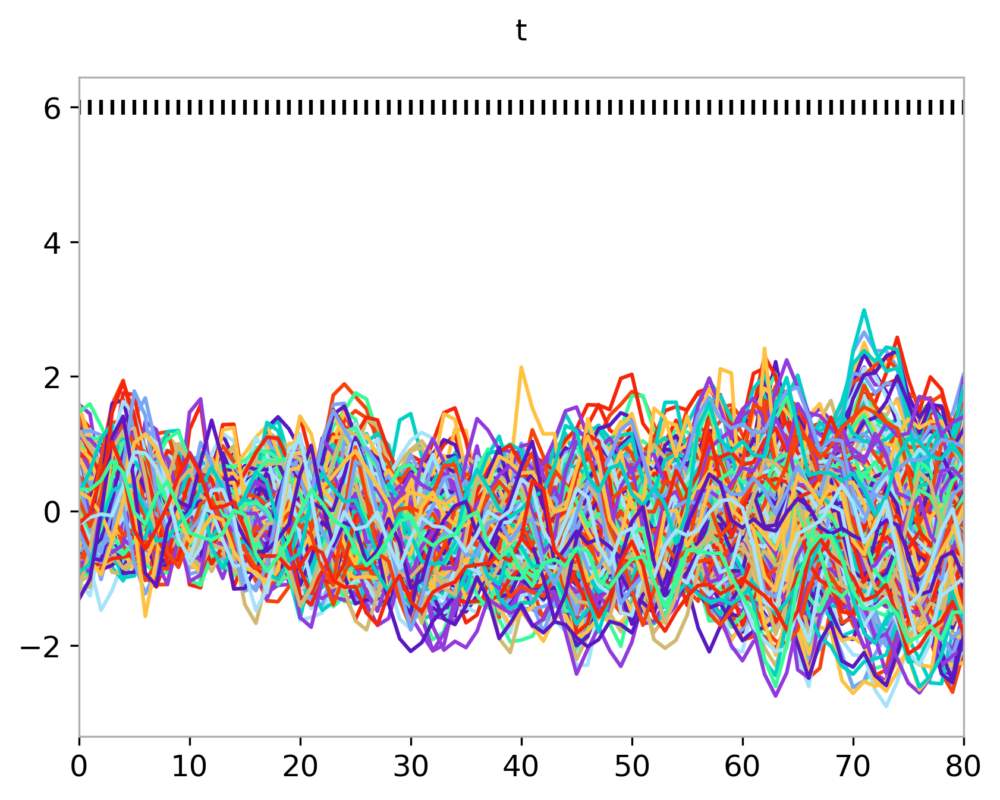

In [277]:
from itertools import groupby

idx = 5

plt.plot(X_train[idx])

plt.scatter(
    np.arange(y_train.shape[1]),
    np.ones(y_train.shape[1]) * 6,
    c=y_train[idx, :, 0] / len(phoneme_list),
    marker="|",
)


pos = 0
for ph_code, group in groupby(y_train[idx, :, 0]):
    duration = len(list(group))
    mid_coord = pos + round(duration / 2)
    pos += duration

    plt.text(mid_coord, 7, phoneme_list[ph_code], ha="center")


plt.show()

In [278]:
import reservoirpy as rpy
from reservoirpy.nodes import Reservoir, Ridge

rpy.set_seed(P.seed)
rpy.verbosity(0)

0

In [282]:
reservoir = Reservoir(500, lr=0.5, sr=0.9, input_scaling=0.1)
readout = Ridge(ridge=1e-8)

esn = reservoir >> readout

In [283]:
from sklearn.preprocessing import RobustScaler, OneHotEncoder

oh_encoder = OneHotEncoder(sparse_output=False)

y_train_oh = oh_encoder.fit_transform(y_train.reshape(-1, 1)).reshape(
    n_train, time_length, -1
)

In [284]:
# warmup with the baseline
warmup = round(np.abs(np.subtract(*P.epochs.baseline)) * ph_epochs.info["sfreq"])

In [285]:
esn.fit(X_train, y_train_oh, warmup=warmup)

'Model-4': Model('Reservoir-4', 'Ridge-4')

In [286]:
raw_pred = esn.run(X_test)

In [287]:
y_pred = np.r_[raw_pred]

In [288]:
y_pred.shape

(3068, 81, 37)

In [289]:
from sklearn.metrics import top_k_accuracy_score, f1_score

top_k_accuracy_score(
    y_test.reshape(-1, 1), y_pred.reshape(-1, len(oh_encoder.categories_[0])), k=1
)

0.0766574919117292

In [290]:
top_k_accuracy_score(
    y_test.reshape(-1, 1), y_pred.reshape(-1, len(oh_encoder.categories_[0])), k=10
)

0.5230857759106347

In [291]:
silence_weight = (y_test != 58 * 1.0).reshape(-1)  # set silence weight to 0

In [292]:
top_k_accuracy_score(
    y_test.reshape(-1, 1),
    y_pred.reshape(-1, len(oh_encoder.categories_[0])),
    k=1,
    sample_weight=silence_weight,
)

0.0766574919117292

In [293]:
top_k_accuracy_score(
    y_test.reshape(-1, 1),
    y_pred.reshape(-1, len(oh_encoder.categories_[0])),
    k=10,
    sample_weight=silence_weight,
)

0.5230857759106347

In [294]:
y_pred_class = np.argmax(y_pred, axis=2)

In [295]:
y_test.shape, y_pred_class.shape

((3068, 81, 1), (3068, 81))

In [296]:
f1_score(y_test.reshape(-1, 1), y_pred_class.reshape(-1, 1), average="micro")

0.04966439712202425

In [298]:
f1_score(
    y_test.reshape(-1, 1),
    y_pred_class.reshape(-1, 1),
    average="micro",
    sample_weight=silence_weight,
)

0.04966439712202425

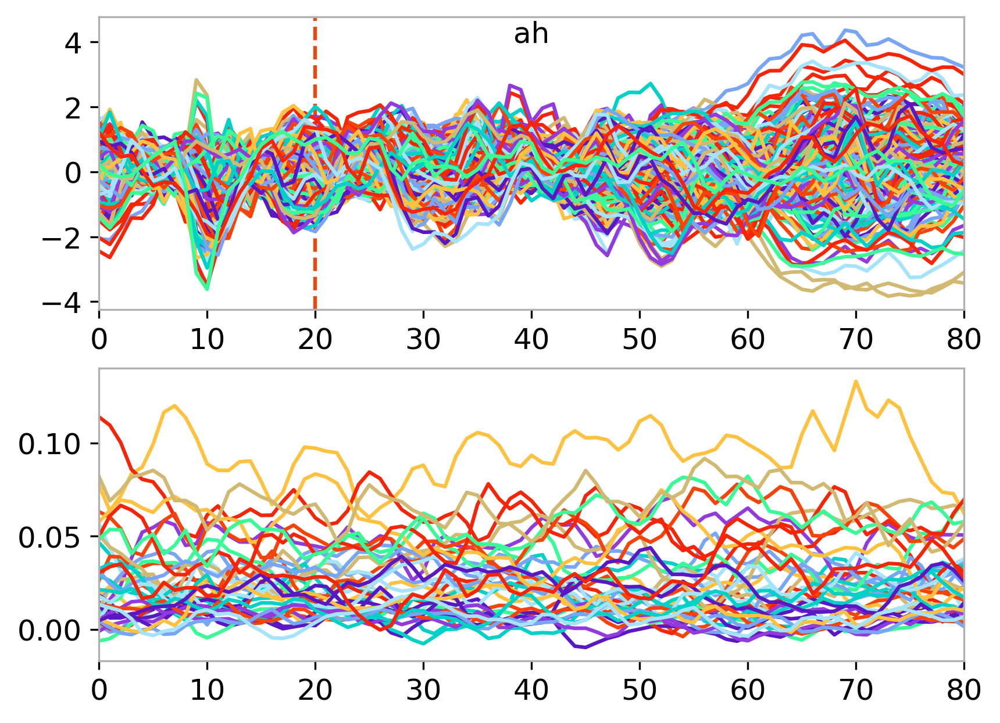

In [316]:
from itertools import groupby

idx = 0

ax = plt.subplot(211)

ax.axvline(
    round((P.epochs.baseline[1] - P.epochs.baseline[0]) * ph_epochs.info["sfreq"]),
    linestyle="--",
)

ax.plot(X_test[idx])

pos = 0
for ph_code, group in groupby(y_test[idx, :, 0]):
    duration = len(list(group))
    mid_coord = pos + round(duration / 2)
    pos += duration

    ax.text(mid_coord, 4, phoneme_list[ph_code], ha="center")


ax2 = plt.subplot(212)

ax2.plot(y_pred[idx])

plt.show()